In [6]:
import csv
import pandas as pd
import numpy as np
import ast
import matplotlib.pyplot as plt
import statistics
import time
from scipy.signal import savgol_filter
from scipy.signal import find_peaks

import importlib
# from TeloFast5 import *
# import TeloFast5
# from TeloFast5 import *
import TeloFast5V2
from TeloFast5V2 import *
# from multiprocessing import Pool
# !pip install pandarallel

from pandarallel import pandarallel

importlib.reload(TeloFast5V2)


<module 'TeloFast5V2' from 'c:\\Users\\Ramin Kahidi\\Bioinformatics\\Telomere Analysis\\Nanopore project\\RawSignalProject\\TeloFast5V2.py'>

In [4]:
# file_path = './data/SquigglePull.fast5/SquigglePull.data.all.tsv'
# file_path = './data/SquigglePull.fast5/SquigglePull.data.filtered.reduced.tsv'
# file_path = './data/SquigglePull.fast5/SquigglePull.data.filtered.tsv'
file_path = './data/F63Fast5/SquigglePull.F63.batch0-1-2.tsv.gz'
# file_path = './data/SquigglePull.fast5/SquigglePull.data.filtered.mapping.reads.tsv'

# Read the first line of the TSV file using csv.reader
# with open(file_path, 'r', newline='') as tsv_file:
#     tsv_reader = csv.reader(tsv_file, delimiter='\t')
#     header = next(tsv_reader)

# print(header)

# signal = header[2:]
# signal = [float(i) for i in signal]

# ****** Randomize the inputted table before grabbing subset, the first reads will be shorter than those read later on 

# reducedDataDf = pd.read_csv(file_path, sep='\t')
reducedDataDf = pd.read_csv(file_path, sep='\t', compression="gzip", error_bad_lines=False)
# problematicReadsDf = pd.read_csv('output/problematicReadQNamesV3.csv')
# reducedDataDf = reducedDataDf[reducedDataDf['qname'].isin(problematicReadsDf['qname'])]
# reducedDataDf = reducedDataDf.head(50)

# signal = reducedDataDf.head(1)["signal"].values[0]
# print(ast.literal_eval(signal)[0])


reducedDataDf["signal"] = reducedDataDf["signal"].apply(lambda x: [float(i) for i in ast.literal_eval(x)])
signalDf = reducedDataDf
# signalDf

In [2]:
print("Start processing")
dfDvsG = pd.read_csv("../Data/F63/reads.table_F63.TeloBP.prim.ClaI.NB50uq_alnScTh.20.txt", sep="\t")
print("Finished reading dfDvsG")
# file_path = './data/F63Fast5/SquigglePull.F63.batch0-1-2.tsv.gz'
# file_path = './data/F63Fast5/SquigglePull.F63.batch0-1-2.tsv/SquigglePull.data.all.tsv'
# file_path = './data/F63Fast5/SquigglePull.F63.batch0-1-2.tsv/SquigglePull.data.1000SubSample.tsv'
file_path = './data/F63Fast5/SquigglePull.F63.batch0-1-2.tsv/SquigglePull.data.1000SubSample.tsv'

Start processing
Finished reading dfDvsG


In [12]:
# print out the head of file_path
with open(file_path, 'r', newline='') as tsv_file:
    tsv_reader = csv.reader(tsv_file, delimiter='\t')
    # grab the 7th line
    for i in range(7):
        header = next(tsv_reader)
    print(header)
    print(len(header))

['batch0.fast5', '007baa35-b57b-4994-b094-e8534cdd87ac', '519', '537', '521', '532', '506', '499', '532', '512', '498', '507', '507', '508', '522', '506', '513', '520', '529', '502', '509', '497', '517', '507', '507', '491', '511', '494', '521', '504', '506', '494', '499', '516', '499', '549', '531', '539', '507', '520', '509', '517', '530', '523', '501', '523', '500', '509', '511', '510', '518', '505', '502', '506', '520', '498', '502', '496', '503', '489', '533', '536', '542', '528', '520', '536', '552', '549', '552', '545', '542', '523', '479', '486', '502', '482', '456', '468', '436', '382', '380', '381', '379', '398', '390', '404', '393', '395', '397', '385', '391', '399', '403', '441', '515', '528', '550', '663', '720', '714', '741', '744', '756', '760', '742', '751', '737', '751', '737', '747', '745', '691', '685', '704', '671', '690', '671', '554', '623', '576', '607', '545', '610', '674', '628', '625', '604', '625', '633', '612', '619', '569', '557', '528', '444', '539', '533'

In [3]:
chunksize = 10
print(f"Chunksize: {chunksize}")
chunks = []
# for chunk in pd.read_csv(file_path, sep='\t', compression="gzip", error_bad_lines=False, chunksize=chunksize):
# for chunk in pd.read_csv(file_path, sep='\t', error_bad_lines=False,quoting=csv.QUOTE_NONE, chunksize=chunksize, header=None):
chunkList = []
with open(file_path, 'r', newline='') as tsv_file:
    chunk = csv.reader(tsv_file, delimiter='\t')

    print("Processing chunk")
    # chunks.append(chunk)
    # print(chunk.head(1))
    # print(chunk)
    # for each row in chunk, convert signal column from string to list of floats
    # for index, row in chunk.iterrows():
    for row in chunk:
        qnm = row[1]
        print(qnm)
        # signal = row[2:].tolist()
        signal = row[2:]

        # print(signal)
        # remove nan and non numerics
        signal = [float(x) for x in signal if isinstance(x, (int, float)) or (isinstance(x, str) and x != 'nan' and not x.endswith('.fast5') and "-" not in x)]
        # signal = [x for x in signal if str(x) != 'nan']
        # signal = [float(i) for i in signal]
        chunkList.append([qnm, signal])
    print(len(chunkList))
    # break close file
    tsv_file.close()

print("done loading")
# chunkList = chunkList[0:100]

# # chunkList = pd.read_csv(file_path, sep='\t', error_bad_lines=False)

print(len(chunkList))
signalDf = pd.DataFrame(chunkList, columns=["qname", "signal"])


# chunk["signal"] = chunk["signal"].apply(lambda x: [float(i) for i in ast.literal_eval(x)])
# signalDf = chunk
# drop all columns in signalDf except qname and signal
signalDf = signalDf[['qname', 'signal']] 
dvsGWithSignal = dfDvsG[dfDvsG["qname"].isin(signalDf["qname"])]    
dvsGWithSignal["isGStrand"] = dvsGWithSignal.apply(lambda row: isGStrand(row["chr"][-1] ,row["strand"]),axis=1)
signalDf = signalDf.merge(dvsGWithSignal[['qname', 'isGStrand']], on='qname', how='left')



# signalDf["PeakCountBasedLength"] = signalDf.apply(getTeloCountLength,axis=1)


# def apply_func_on_df(df):
#     return df.apply(getTeloCountLength, axis=1)

# def parallelize_dataframe(df, func, n_cores=4):
#     df_split = np.array_split(df, n_cores)
#     pool = Pool(n_cores)
#     df = pd.concat(pool.map(func, df_split))
#     pool.close()
#     pool.join()
#     return df


# # Use the function on your DataFrame
# signalDf["PeakCountBasedLength"] = parallelize_dataframe(testSubSample, apply_func_on_df)

# testSubSample = signalDf.head(50)


# # merge signal into dotsAbove
# # drop all columns except qname and 'TeloNP.dorado.length', 'TeloNP.guppy.length'
# dotsAbove = dotsAbove[['qname', 'TeloNP.dorado.length', 'TeloNP.guppy.length']]
# dotsAbove = dotsAbove.merge(signalDf, on='qname', how='left')
# # dotsAbove = dotsAbove.merge(dvsGWithSignal[['qname', 'isGStrand']], on='qname', how='left')
# print(dotsAbove.columns)

pandarallel.initialize(progress_bar=True )

signalDf["PeakCountBasedLengthGuppy"] = signalDf.parallel_apply(getTeloCountLength,axis=1)

# drop signal column
saveDf = signalDf.drop(columns=["signal"])
# chunks.append(saveDf)

# outputDf = pd.concat(chunks, axis=0)
dvsGWithSignalShortened = signalDf
saveDf.to_csv('output/F63.subset1000.peak.count.V3.1.tsv', sep='\t')
print("Finished processing")

Chunksize: 10
Processing chunk
cb9057a0-e0d3-4b55-b8a2-e0e62eae4f75
1af86b00-646f-4b61-a836-bbb7dc658298
5eaf6bf6-6540-4539-bca5-08b297ff2b06
08dce1e1-4df8-4210-958b-fe27b35b95f2
36cd33a0-7809-44d8-947f-9726455b1b31
5e9b6c39-02ac-4c85-9b65-15cf1e902b6c
d6519078-4811-469c-a349-f1db9950894b
7e6e38c4-c05a-44b1-85d1-a4022c6f2cba
f8d43864-aee1-4e5b-a8d8-a0a1f47b5cd4
d7b9fd68-7c37-45e0-83fb-7e8c265a5a02
d9ca1cf5-b707-4e12-9345-72de29542b2a
984ef59c-46d3-44dc-99bb-12987470dbce
56ef426b-2e7b-44d8-bb27-708062990cd9
356848dc-1446-4301-943b-33bc38f3e7cd
26eedefb-fe2b-4ea7-9ffa-75f2ce611a95
3b01ab86-6b06-47c9-ab50-706b7e92c686
9f906f7b-4235-4874-8f82-86a4318d819f
eb3190d5-873a-4f8e-a8f7-8d8f760349fb
6b79e719-abe0-41dd-b7b6-5230c2ed0299
73a21db6-2478-4f69-8741-b377ec9f9957
f99fbbfc-1abe-4b75-bf61-19cb4597c1e4
0d7c5d6e-cdbc-40d9-81ab-515b6067a837
508cd784-88c5-4f80-a86f-ab1164345d63
0eb49e73-3576-4f52-9a7d-c25cca8926da
440affe1-e51f-4e7e-a60d-51e1026b09e8
f75f807a-e41a-4761-af3c-b221bf299d91
cb2fc9c

C:\Users\Ramin Kahidi\AppData\Local\Temp\ipykernel_3900\2137115056.py:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dvsGWithSignal["isGStrand"] = dvsGWithSignal.apply(lambda row: isGStrand(row["chr"][-1] ,row["strand"]),axis=1)


INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


Finished processing


In [17]:
testSubSample

,qname,signal,isGStrand,PeakCountBasedLengthGuppy
0,cb9057a0-e0d3-4b55-b8a2-e0e62eae4f75,"[777.0, 433.0, 442.0, 443.0, 563.0, 640.0, 532...",True,4446
1,1af86b00-646f-4b61-a836-bbb7dc658298,"[527.0, 540.0, 517.0, 517.0, 533.0, 538.0, 536...",True,3564
2,5eaf6bf6-6540-4539-bca5-08b297ff2b06,"[572.0, 396.0, 404.0, 413.0, 413.0, 401.0, 405...",True,7452
3,08dce1e1-4df8-4210-958b-fe27b35b95f2,"[668.0, 406.0, 394.0, 411.0, 406.0, 396.0, 402...",True,9870
4,36cd33a0-7809-44d8-947f-9726455b1b31,"[623.0, 423.0, 425.0, 428.0, 425.0, 421.0, 420...",True,5436
5,5e9b6c39-02ac-4c85-9b65-15cf1e902b6c,"[415.0, 404.0, 434.0, 441.0, 442.0, 462.0, 449...",False,6726
6,d6519078-4811-469c-a349-f1db9950894b,"[498.0, 433.0, 453.0, 442.0, 431.0, 439.0, 434...",True,4056
7,7e6e38c4-c05a-44b1-85d1-a4022c6f2cba,"[423.0, 446.0, 427.0, 417.0, 399.0, 412.0, 411...",False,6228
8,f8d43864-aee1-4e5b-a8d8-a0a1f47b5cd4,"[626.0, 631.0, 644.0, 629.0, 634.0, 633.0, 637...",False,4578
9,d7b9fd68-7c37-45e0-83fb-7e8c265a5a02,"[422.0, 420.0, 421.0, 425.0, 415.0, 418.0, 411...",True,3738


In [8]:
dfDvsG

,qname,chr,strand,pos.start,pos.end,map.pos.from.Tel,mapq,seq.ln,Telomere,alnSc.ClaI.NB50uq
0,67972c56-3606-4188-9283-54332ed5a26d,chr01p,-,28,25514,28,28,30275,5516,47.562134
1,b9f968ee-4219-47ca-bf95-3bd68f456910,chr01p,-,28,25514,28,9,32044,6661,35.681103
2,b89f004b-dd24-4029-adea-1671610a98c5,chr01p,+,36,4799,36,45,11987,7120,47.562134
3,5cd663f4-dbf9-4c88-a686-2458e2bb77f8,chr01p,+,36,3831,36,22,13517,9556,21.717592
4,3d0cd0c0-c769-4f12-a476-01ec8109f757,chr01p,-,40,6908,40,1,7720,853,35.562145
...,...,...,...,...,...,...,...,...,...,...
11776,90bbf942-8664-4d36-a07f-7ef3eaf22b2a,chrYq,-,-25153,-1,1,1,28857,2502,47.562134
11777,ec3a3110-32f3-4703-b90a-38328b4c14d0,chrYq,-,-3871,-1,1,1,6982,3373,35.681103
11778,7c3d5aa2-360f-498e-aab5-e497d92ec803,chrYq,-,-3038,-1,1,1,6428,3575,21.699348
11779,9c9459f1-86da-4e09-822f-6f81540cb0af,chrYq,+,-38696,-11,11,1,45761,6000,47.562134


In [ ]:
# dfDvsG = pd.read_csv("./data/F61.F71.telomeres.for.Kayarash.txt", sep="\t")
dfDvsG = pd.read_csv("../Data/F63/reads.table_F63.TeloBP.prim.ClaI.NB50uq_alnScTh.20.txt", sep="\t")

# dfDvsG = pd.read_csv("./data/mappings/for.Ramin.Tel.diff.by.mapping.10000.txt", sep=" ")
dfDvsG
dvsGWithSignal = dfDvsG[dfDvsG["qname"].isin(signalDf["qname"])]    

NameError: name 'signalDf' is not defined

In [ ]:

# dvsGWithSignal["isGStrand"] = dvsGWithSignal.apply(isGStrand,axis=1)
dvsGWithSignal["isGStrand"] = dvsGWithSignal.apply(lambda row: isGStrand(row["chr"][-1] ,row["strand"]),axis=1)

#dvsGWithSignal["isGStrandNoTelMap"] = dvsGWithSignal.apply(lambda row: isGStrand(row, strandCol="strand.noTelMap", chrCol="chr.noTelMap"),axis=1)
#dvsGWithSignal["isGStrandWTelMap"] = dvsGWithSignal.apply(lambda row: isGStrand(row, strandCol="strand.wTelMap", chrCol="chr.wTelMap"),axis=1)

#notMatchingStrands = dvsGWithSignal[dvsGWithSignal["isGStrandNoTelMap"] != dvsGWithSignal["isGStrandWTelMap"]]
#print(notMatchingStrands)
#if len(notMatchingStrands) > 0:
#    print("WARNING: Not all strands match between noTelMap and wTelMap. ")
#dvsGWithSignal = dvsGWithSignal[dvsGWithSignal["isGStrandNoTelMap"] == dvsGWithSignal["isGStrandWTelMap"]]
#dvsGWithSignal["isGStrand"] = dvsGWithSignal["isGStrandWTelMap"]

# print(dvsGWithSignal)
# signalDf["isGStrand"] = dvsGWithSignal.loc[dvsGWithSignal['qname'] == signalDf["qname"], 'isGStrand'],
# signalDf.update(dvsGWithSignal[['isGStrand']].set_index(dvsGWithSignal['qname']))
signalDf = signalDf.merge(dvsGWithSignal[['qname', 'isGStrand']], on='qname', how='left')

# shortenedDf = signalDf.head(100)
# shortenedDf["PeakCountBasedLength"] = shortenedDf.apply(getTeloCountLength,axis=1)
# shortenedDf

# *********
signalDf["PeakCountBasedLength"] = signalDf.apply(getTeloCountLength,axis=1)
# *********

# dvsGWithSignal["PeakCountBasedLength"] = getTeloCountLength(signalDf.loc[signalDf['qname'] == dvsGWithSignal["qname"], 'strand'], dvsGWithSignal["isGStrand"])
# signalDf
# dvsGWithSignal
# for index, row in dvsGWithSignal.iterrows():
#     # print(row)
#     print(isGStrand(row))

    

C:\Users\Ramin Kahidi\AppData\Local\Temp\ipykernel_8920\1074816699.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dvsGWithSignal["isGStrand"] = dvsGWithSignal.apply(lambda row: isGStrand(row["chr"][-1] ,row["strand"]),axis=1)


start set
start set
start set
areaMedian was: -246.0
start set
areaMedian was: -242.0
start set
start set
start set
areaMedian was: -280.0
start set
areaMedian was: 632.0
start set
start set
areaMedian was: -275.0
start set
areaMedian was: -260.5
start set
start set
start set
start set
start set
areaMedian was: -243.0
start set
start set
start set
start set
start set
areaMedian was: 364.0
start set
start set
start set
start set
areaMedian was: 526.0
start set
start set
start set
start set
start set
areaMedian was: 418.5
start set
start set
start set
start set
start set
areaMedian was: -265.0
start set
start set
areaMedian was: 488.0
start set
start set
areaMedian was: -307.0
start set
start set
areaMedian was: -243.5
start set
areaMedian was: 567.0
start set
areaMedian was: -251.0
start set
start set
areaMedian was: 550.0
start set
start set
areaMedian was: 646.0
start set
areaMedian was: -269.5
start set
start set
areaMedian was: 44.0
start set
areaMedian was: -287.0
start set
start s

qname                     5ee84971-079d-45e4-be9e-778ea68bded6
signal       [455.0, 416.0, 436.0, 415.0, 428.0, 408.0, 430...
isGStrand                                                 True
Name: 0, dtype: object
[455.0, 416.0, 436.0, 415.0, 428.0, 408.0, 430.0, 420.0, 435.0, 421.0, 415.0, 436.0, 399.0, 415.0, 435.0, 432.0, 444.0, 427.0, 429.0, 437.0, 392.0, 412.0, 444.0, 429.0, 423.0, 426.0, 427.0, 436.0, 414.0, 408.0, 428.0, 429.0, 441.0, 429.0, 436.0, 419.0, 418.0, 439.0, 429.0, 424.0, 408.0, 413.0, 425.0, 427.0, 434.0, 428.0, 440.0, 416.0, 433.0, 423.0, 382.0, 405.0, 415.0, 422.0, 418.0, 422.0, 435.0, 423.0, 401.0, 412.0, 442.0, 448.0, 456.0, 430.0, 411.0, 465.0, 468.0, 447.0, 414.0, 405.0, 426.0, 429.0, 408.0, 416.0, 432.0, 431.0, 410.0, 404.0, 427.0, 427.0, 423.0, 409.0, 427.0, 411.0, 420.0, 417.0, 425.0, 423.0, 395.0, 426.0, 423.0, 411.0, 421.0, 423.0, 417.0, 427.0, 384.0, 388.0, 396.0, 401.0, 398.0, 363.0, 321.0, 325.0, 312.0, 302.0, 314.0, 310.0, 371.0, 406.0, 389.0, 371.0, 379

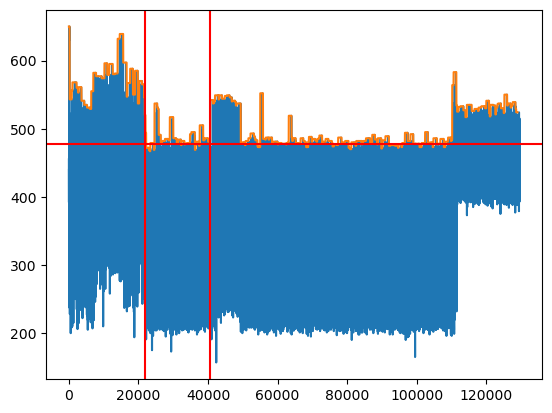

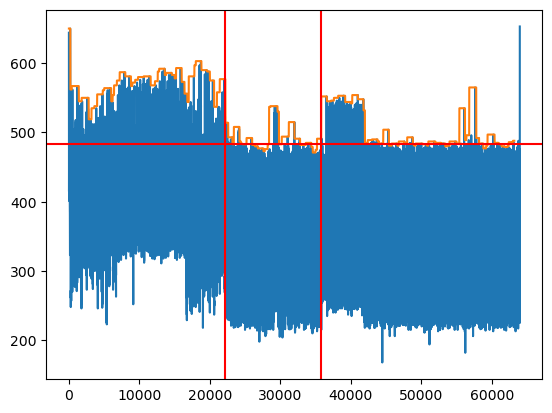

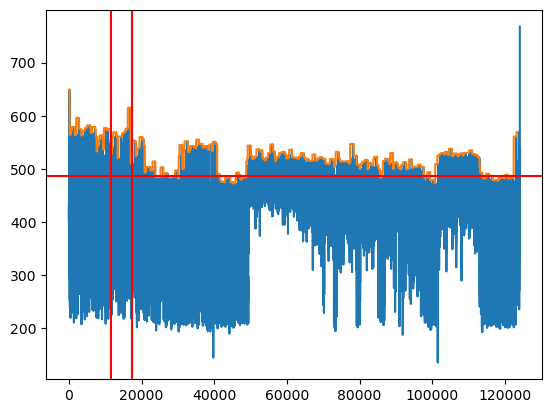

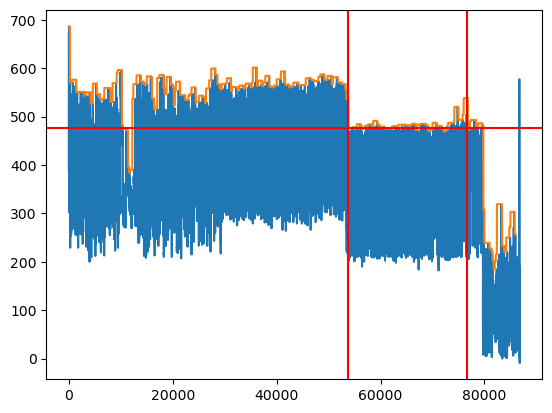

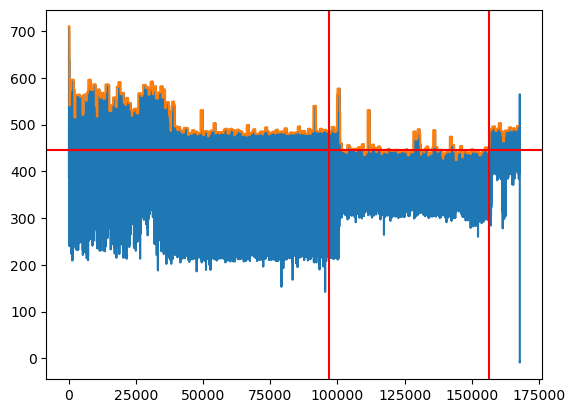

: 

: 

In [10]:
# index 6 for G strands should be checked for the pre telo region
# G strand end is werid on index 8

for i in range(len(signalDf[signalDf["isGStrand"] == True])):
# i=8
    # signalRow = signalDf.loc[signalDf["qname"] == "0795fc60-3889-407a-a184-dd46c11e890e"]
    signalRow = signalDf[signalDf["isGStrand"] == True].iloc[i]
    print(signalRow)
    # signalRow = signalDf.iloc[0].values[0]
    signal = signalRow["signal"]
    isGStrand = signalRow["isGStrand"]
    # for i in range(10000):
    #     signal.append(1000)
    if not isGStrand:
        flippedSignal =  [-x for x in reversed(signal)]
        signal = flippedSignal
    print(signal)
    print(signal[0])
    # smoothed_signal = savgol_filter(signal, window_length = 50, polyorder=4)



    stepValue =200
    ceiling= waveCeiling(signal, window= 850, step=stepValue)
    sortedCeiling = sorted(ceiling)
    teloCeiling =sortedCeiling[int(0.15*len(ceiling))]
    start, end = 0,0
    if isGStrand:
        start, end = getTeloRegionFromCeilings(signal, ceiling, teloCeilingCeof=0.25,lookAheadCeof= 0.5)
    else:
        start, end = getTeloRegionFromCeilings(signal, ceiling, teloCeilingCeof=0.15,lookAheadCeof= 0.5)
    print("start: "+str(start))
    print("end: "+str(end))

    lIndex = end -500
    rIndex = end +1000

    plt.figure(i) 
    plt.plot(signal)
    # plt.plot(smoothed_signal)
    plt.plot(ceiling)
    plt.axvline(x=start, color="red")
    plt.axvline(x=end, color="red")
    # plt.axvline(x=1000, color="red")
    plt.axhline(y=teloCeiling, color="red")
    count = 0
    # if isGStrand:
    #     count = getPeakCountGStrand(signal[lIndex:rIndex], teloCeiling=teloCeiling)
    # else:
    #     count = getPeakCountCStrand(signal[lIndex:rIndex], teloCeiling=teloCeiling)

    print("raw Count: "+str(count))
    # plt.plot(signal)
plt.show()

In [4]:
my_list = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
start_index = 9
window_size = 5
print(my_list[start_index:start_index+window_size])

[10]


In [5]:

# signalData = []

# # Read the TSV file using csv.reader
# with open(file_path, 'r', newline='') as tsv_file:
#     tsv_reader = csv.reader(tsv_file, delimiter='\t')
#     headers = []
     
#     # Iterate through the lines and store each line in the 'headers' list
#     for line in tsv_reader:
#         name = line[1]
#         if name in dfDvsG["qname"].values:
#             # print(name)
#             signal = line[2:]
#             signal = [float(i) for i in signal]
#             signalData.append([name, signal])

# signalDf = pd.DataFrame(signalData,columns=['qname', "signal"])

# dvsGWithSignal = dfDvsG[dfDvsG["qname"].isin(signalDf["qname"])]    

In [43]:
signalData = []
# print(signalDf)

In [37]:

testingDF = signalDf[signalDf["qname"].isin(graphingDF["qname"])]
testingDF

,qname,signal,isGStrand,PeakCountBasedLength
97,5ee84971-079d-45e4-be9e-778ea68bded6,"[455.0, 416.0, 436.0, 415.0, 428.0, 408.0, 430...",True,1530
189,b9a65800-c506-4d42-947b-6a47eff099a8,"[644.0, 426.0, 446.0, 438.0, 429.0, 444.0, 428...",True,972
272,0039269e-1ad5-46ed-ab8b-528a19bc6bf8,"[744.0, 421.0, 442.0, 431.0, 434.0, 420.0, 422...",False,546
394,5da67c9d-27a5-4ccb-a10b-1a7cd6ba1b33,"[687.0, 512.0, 498.0, 448.0, 488.0, 504.0, 541...",False,228
410,6bc60ea3-a909-4a63-abfe-edf20feb7b14,"[413.0, 437.0, 419.0, 420.0, 429.0, 418.0, 414...",True,276
411,6c6b15d1-bd38-4b8f-b3dd-9cc317f2b25c,"[420.0, 397.0, 401.0, 419.0, 412.0, 430.0, 406...",False,786
481,a5d302e4-90a2-4785-8d0c-4d5cb04fd196,"[670.0, 405.0, 410.0, 406.0, 403.0, 390.0, 389...",True,1692
483,a785aa8c-6df1-4a2a-a903-4284e4d66a3f,"[608.0, 482.0, 475.0, 488.0, 473.0, 480.0, 456...",False,366
519,cf05836f-7fe9-4566-88ee-cae53ecdefa9,"[388.0, 432.0, 436.0, 401.0, 442.0, 637.0, 659...",True,270
540,e0833c1a-7cfe-4bcc-bd63-f726c5ec0514,"[737.0, 458.0, 454.0, 479.0, 454.0, 458.0, 453...",False,624


In [2]:
# signalDf.to_csv("tempData/problematicReads.csv", index=False)
signalDf = pd.read_csv("tempData/problematicReads.csv")
signalDf["signal"] = signalDf["signal"].apply(lambda x: [float(i) for i in ast.literal_eval(x)])

In [208]:
# merge shortReads and signalDf
shortReads = shortReads.merge(signalDf[['qname', 'signal']], on='qname', how='left')

In [210]:
GstrandDf = graphingDF[graphingDF["isGStrand"] == True]

flipping signal
Unnamed: 0                                                                  23
qname                                     0eb49e73-3576-4f52-9a7d-c25cca8926da
isGStrand                                                                False
PeakCountBasedLengthGuppy                                                   36
TeloNP.dorado.length                                                    8249.0
TeloNP.guppy.length                                                     7608.0
signal                       [602.0, 505.0, 486.0, 472.0, 495.0, 478.0, 493...
Name: 0, dtype: object
89075


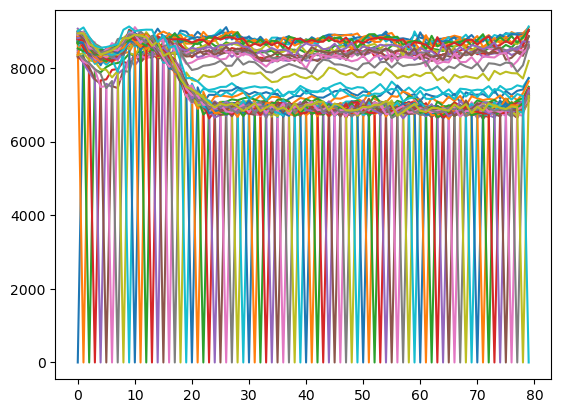

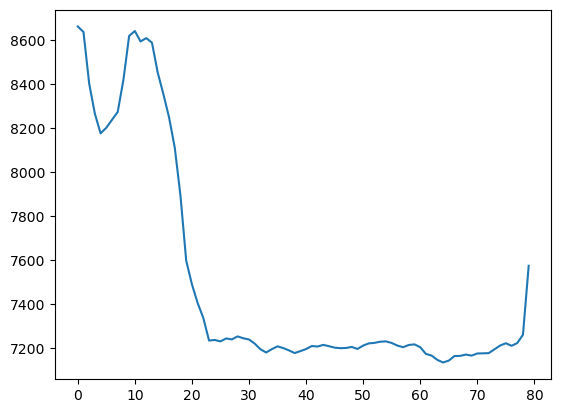

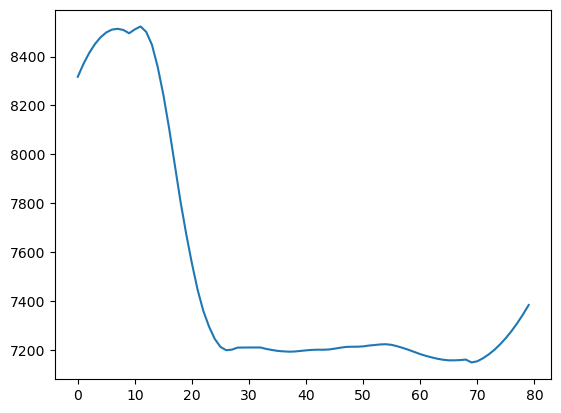

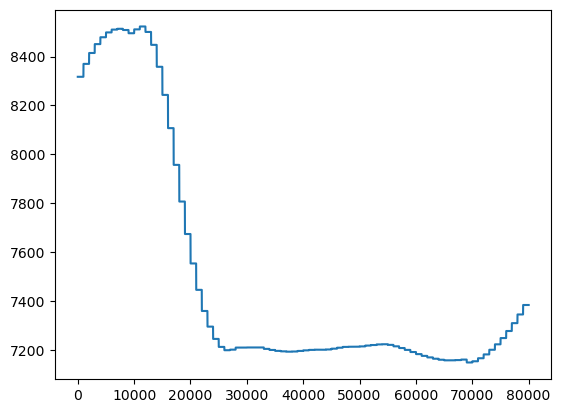

The repeating pattern starts at index 69000 and ends at index 


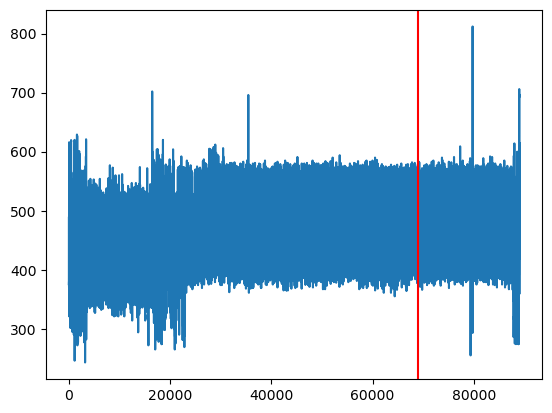

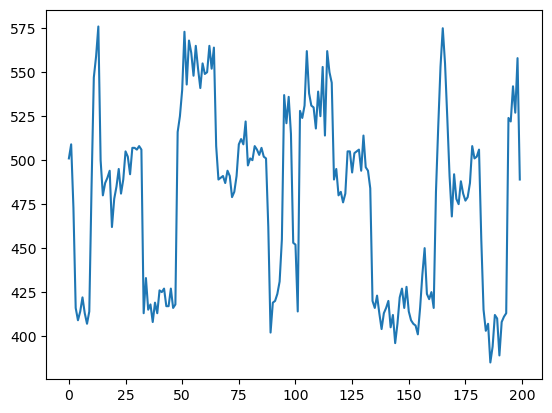

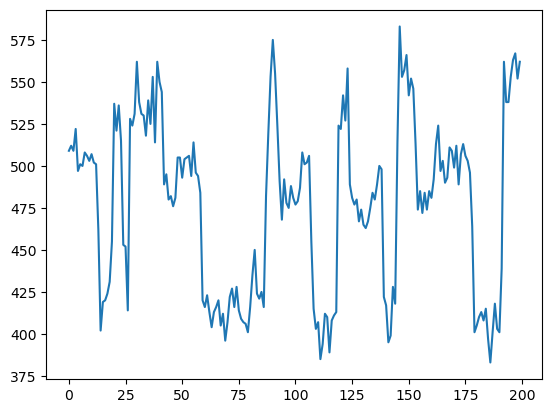

In [13]:
import numpy as np
from scipy.spatial.distance import euclidean
from sklearn.preprocessing import normalize

def find_repeating_pattern(signal,isGStrand, window_size, window_step=1):
    # # Normalize the signal
    # signal = normalize(signal[:,np.newaxis], axis=0).ravel()
    
    # Create a sliding window
    windows = [signal[i:i+window_size] for i in range(0,len(signal)-window_size+1,window_step)]
    
    # Calculate the Euclidean distance between each pair of windows
    distances = [[euclidean(w1, w2) for w2 in windows] for w1 in windows]
    
    plt.plot(distances)
    plt.show()
    
    # Average the distances
    avg_distances = np.mean(distances, axis=0)
    plt.plot(avg_distances)
    plt.show()
    
    # smooth out the values in avg_distances
    avg_distances = savgol_filter(avg_distances, window_length = 20, polyorder=2)
    plt.plot(avg_distances)
    plt.show()
    
    # Repeat each value in avg_distances by window_step times
    avg_distances = np.repeat(avg_distances, window_step)
    
    plt.plot(avg_distances)
    plt.show()
    repeating_pattern_start = 0
    
    if isGStrand:
        # Find the window with the smallest average distance
        # repeating_pattern_start = np.argmax(avg_distances)
        repeating_pattern_start = np.argmin(avg_distances)
    else:
        # Find the window with the smallest average distance
        repeating_pattern_start = np.argmin(avg_distances)
    
    # return repeating_pattern_start + window_size
    return repeating_pattern_start

# testDf = GstrandDf
testDf = dotsAbove
# testDf = shortReads
index = 0
sampleSignal = testDf.iloc[index]["signal"]
if testDf.iloc[index]["isGStrand"] == False:
    print("flipping signal")
    flippedSignal =  [x for x in reversed(sampleSignal)]
    sampleSignal = flippedSignal



print(testDf.iloc[index])
# sampleSignal = sampleSignal[-2300:-1300]
# append a bunch of random to the end of the signal
# for i in range(2000):
#     # sampleSignal = np.append(sampleSignal, random.randint(0, 1000))
#     sampleSignal.append(random.randint(0, 500))
# sampleSignal = sampleSignal[::-1]
# smooth the signal
# sampleSignal = savgol_filter(sampleSignal, window_length = 51, polyorder=4)

window_size = 10000
# convert to numpy array
sampleSignal = np.array(sampleSignal)
# sampleSignal = normalize(sampleSignal[:,np.newaxis], axis=0).ravel()
    

print(len(sampleSignal))
# Assuming 'signal' is your 1D signal and 'window_size' is the size of the repeating pattern
# start = find_repeating_pattern(sampleSignal[-1*len(sampleSignal)//2:],testDf.iloc[index]["isGStrand"],  window_size, window_step=1000)
start = find_repeating_pattern(sampleSignal,testDf.iloc[index]["isGStrand"],  window_size, window_step=1000)
# start = getTelomereCenter(sampleSignal,testDf.iloc[index]["isGStrand"],  window_size, window_step=1000)
# start = getTelomereCenter(sampleSignal,testDf.iloc[index]["isGStrand"])
# start = len(sampleSignal)//2 + start

print(f"The repeating pattern starts at index {start} and ends at index ")
plt.plot(sampleSignal)
plt.axvline(x=start, color="red")
plt.show()

# show area around the start
plt.plot(sampleSignal[start-100:start+100])
plt.show()
start = -20000

plt.plot(sampleSignal[start-100:start+100])
plt.show()


In [22]:
testingIsGStrand = False
readRow = 3
# testingDF = testSubSample

signalInRow = testingDF.loc[testingDF['isGStrand'] == testingIsGStrand].iloc[readRow]
print(signalInRow)
signalIn = signalInRow["signal"]
signalIn = np.array(signalIn)
teloCenter = getTelomereCenter(signalIn,signalInRow["isGStrand"])
print(f"teloCenter: {teloCenter}")

Unnamed: 0                                                                  34
qname                                     049ba171-817b-442c-99c7-07dc3413d8ee
isGStrand                                                                False
PeakCountBasedLengthGuppy                                                  264
TeloNP.dorado.length                                                    3271.0
TeloNP.guppy.length                                                     3283.0
signal                       [442.0, 447.0, 455.0, 442.0, 452.0, 436.0, 454...
Name: 11, dtype: object
teloCenter: 2000


In [42]:
# grab first 10 rows in dotsAbove
# f10DotsAbove = dotsAbove.head(10)
# drop getPeakCountBasedLengthGuppy columnm
dotsAbove = dotsAbove.drop(columns=["PeakCountBasedLengthGuppy"])

pandarallel.initialize(progress_bar=True )

dotsAbove["PeakCountBasedLengthGuppy"] = dotsAbove.parallel_apply(getTeloCountLength,axis=1)

INFO: Pandarallel will run on 6 workers.
INFO: Pandarallel will use standard multiprocessing data transfer (pipe) to transfer data between the main process and workers.

https://nalepae.github.io/pandarallel/troubleshooting/


Unnamed: 0                                                                  92
qname                                     25f80ad2-bedf-434a-a515-a3e92e103340
isGStrand                                                                False
PeakCountBasedLengthGuppy                                                 5784
TeloNP.dorado.length                                                    9625.0
TeloNP.guppy.length                                                     9320.0
signal                       [622.0, 527.0, 525.0, 516.0, 510.0, 522.0, 516...
Name: 9, dtype: object
-----------------
-----------------
teloCenter: 102891
teloCeiling: -415.0
ceiling done
teloCenter: 102891
start set
areaMedian was: -339.0
Raw count Length: 6570
time based: 8880.0


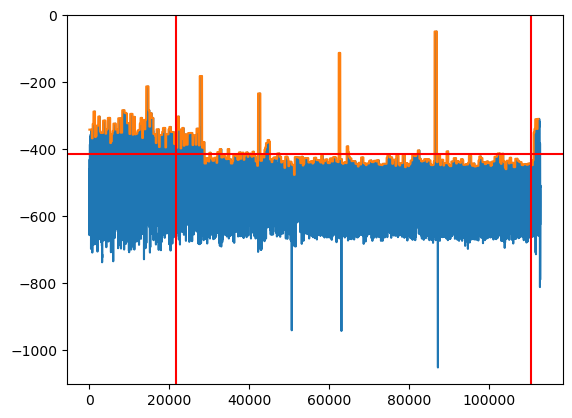

In [56]:


testingIsGStrand = False

# for i in signalArray:
# plt.plot(signalArray[2][-12000:-10000], label=name)
# plt.plot(signalArray[2], label=name)

readRow = 6

# testingDF = signalDf[signalDf["qname"].isin(graphingDF["qname"])]
# testingDF = signalDf
# testingDF = shortReads
# testingDF = testSubSample
testingDF = dotsAbove

# signalIn = signalDf.iloc[readRow]["signal"]
# signalIn = signalDf.loc[signalDf['isGStrand'] == False, 'signal'].iloc[3]
signalInRow = testingDF.loc[testingDF['isGStrand'] == testingIsGStrand].iloc[readRow]
signalIn = signalInRow["signal"]
qname = signalInRow["qname"]
# print(qname)
print(signalInRow)

if not testingIsGStrand:
    flippedSignal =  [-x for x in reversed(signalIn)]
    signalIn = flippedSignal

stepValue =200    
ceiling= waveCeiling(signalIn, window= 500, step=stepValue)
window_size = 20000
# print(find_repeating_pattern(signalIn,testingIsGStrand,  window_size, window_step=1000))

print("-----------------")
# print(getTeloCountLength(signalInRow))
print("-----------------")

teloCenter = getTelomereCenter(signalIn,testingIsGStrand)
print(f"teloCenter: {teloCenter}")
teloCeiling =statistics.median(ceiling[max(0,int(teloCenter)-1000):int(teloCenter)+1000])
print(f"teloCeiling: {teloCeiling}")



# stepValue =200
# ceiling= waveCeiling(signalIn, window= ceilingWindow, step=stepValue)
# # sortedCeiling = sorted(ceiling)
# # teloCeiling =sortedCeiling[int(0.15*len(ceiling))]
# teloCenter = getTelomereCenter(signalIn,False)
# # print(f"teloCenter within teloCountLength Helloooo: {teloCenter}")
# teloCeiling =statistics.median(ceiling[max(0,teloCenter-500):teloCenter+500])
# # print(f"teloCeiling within teloCountLength Helloooo: {teloCeiling}")
# start, end = getTeloRegionFromCeilings(teloCenter, ceiling,teloCeiling)
# # start, end = getTeloRegionFromCeilings(teloCenter, ceiling,teloCeiling, teloCeilingCeof=0.15)
# count = getPeakCountCStrand(signalIn[start:end], teloCeiling)

print("ceiling done")
# ceiling.sort()
# sortedCeiling = sorted(ceiling)
# teloCeiling =sortedCeiling[int(0.25*len(ceiling))]
# print(teloCeiling)

# lIndex = 60000
# rIndex = 61000
plt.plot(signalIn)
plt.plot(ceiling)
# smoothedSignal = savgol_filter(signalIn, window_length = 40, polyorder=4)
# plt.plot(smoothedSignal)
time_series_data = np.array(ceiling)
# smoothedCeilingSignal = savgol_filter(ceiling, window_length = 10000, polyorder=0)
# z_scores = np.abs((time_series_data - time_series_data.mean()) / time_series_data.std())
# z_score_threshold = 3
# time_series_data_no_outliers = time_series_data[z_scores < z_score_threshold]
# plt.plot(ceiling)
# start, end = getTeloStartEndGStrand(smoothedSignal, nonTeloThreshold=teloCeiling+40)
# start, end = getTeloRegionFromCeilings(teloCenter, ceiling, teloCeilingCeof=0.25,lookAheadCeof= 0.5)
start, end = getTeloRegionFromCeilings(teloCenter, ceiling,teloCeiling)
count = 0
if testingIsGStrand:
    count = getPeakCountGStrand(signalIn[start:end], teloCeiling)
else:
    count = getPeakCountCStrand(signalIn[start:end], teloCeiling)

# print("Raw Count: "+str(count))
print("Raw count Length: "+str(count*6))
print("time based: " +str(getTeloLengthByTime(end-start, 4000, 400)))
# print(dvsGWithSignal[dvsGWithSignal["qname"]==qname])
plt.axvline(x=start, color="red")
plt.axvline(x=end, color="red")
plt.axhline(y=teloCeiling, color="red")



In [41]:
teloCenter

282000

2
Raw count Length: 6186
time based: 25340.0


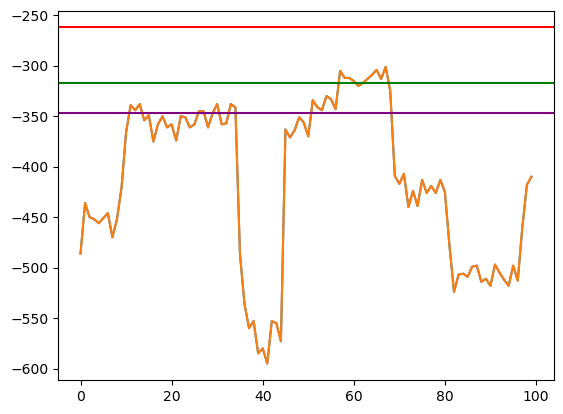

In [47]:

plt.plot(signalIn[start:start+100])
# plt.plot(ceiling)
# smoothedSignal = savgol_filter(signalIn, window_length = 40, polyorder=4)
# time_series_data = np.array(ceiling)
# start, end = getTeloRegionFromCeilings(signalIn,signalInRow["isGStrand"], ceiling, teloCeilingCeof=0.25,lookAheadCeof= 0.5)
# count = 0
# if testingIsGStrand:
#     count = getPeakCountGStrand(signalIn[start:end], teloCeiling)
# else:
#     count = getPeakCountCStrand(signalIn[start:end], teloCeiling)

print(getPeakCountCStrand(signalIn[start:start+100], teloCeiling))

# print("Raw Count: "+str(count))
print("Raw count Length: "+str(count*6))
print("time based: " +str(getTeloLengthByTime(end-start, 4000, 400)))
# print(dvsGWithSignal[dvsGWithSignal["qname"]==qname])
# plt.axvline(x=start, color="red")
# plt.axvline(x=end, color="red")
# plt.axhline(y=teloCeiling, color="red")

In [ ]:
# dvsGWithSignalShortened.to_csv('output/Tel.diff.by.mapping.peak.count.V2.csv')
# dvsGWithSignalShortened.to_csv('output/Tel.diff.by.mapping.peak.count.tsv', sep='\t')
dvsGWithSignalShortened.to_csv('output/F63.peak.count.tsv', sep='\t')

In [ ]:
# signalDf = signalDf.drop(columns=["isGStrand_x","isGStrand_y"])
# signalDf
dvsGWithSignalShortened = dvsGWithSignal.merge(signalDf[['qname', 'PeakCountBasedLength']], on='qname', how='left')

NameError: name 'dvsGWithSignal' is not defined

In [5]:
graphingDF = dvsGWithSignalShortened
# graphingDF = pd.read_csv('output/rawSignalAnalysis.tsv', sep='\t')
# graphingDF = pd.read_csv('output/Tel.diff.by.mapping.peak.count.tsv', sep='\t')
# graphingDF = pd.read_csv('output/Tel.diff.by.mapping.peak.count.V2.csv')

In [6]:
# remove rows where peakCountbasedLength is less than 100
# graphingDF = graphingDF[(graphingDF['PeakCountBasedLength'] < 2000) & (graphingDF['F61.Guppy.Tel.bp'] > 2700)]
# graphingDF = graphingDF[(graphingDF['PeakCountBasedLength'] < 200) ]
# graphingDF.to_csv('output/problematicReadQNamesV3.csv')
# graphingDF = pd.read_csv('output/problematicReadQNamesV2.csv')

# V3 means I now seperate the lookAheadCoef from the teloCeilingCoef
# graphingDF.to_csv('output/Tel.diff.by.mapping.peak.countV3.1.tsv', sep='\t')
# graphingDF = pd.read_csv('output/Tel.diff.by.mapping.peak.countV3.1.tsv', sep='\t')



In [23]:
print(len(graphingDF))

1904


In [37]:
# Read in TeloNP data 
import os
teloNPDir = "../TelomereBoundaryProject/DoubleBlindRawReadLabels/output/fullDSCorrected/all/"
# for all files in teloNPDir, load the F63 data into the graphingDF
# 2D list of qname and teloNP corrected length
qnameTelpNp = []
for filename in os.listdir(teloNPDir):
    if filename.endswith(".csv") and "F63" in filename:
        print(filename)
        teloNPData = pd.read_csv(teloNPDir+filename)
        # graphingDF = graphingDF.merge(teloNPData[['qname', 'TeloNPCorrectedLength']], on='qname', how='left')
        qnameTelpNp.extend(teloNPData[['qname', 'TeloNPCorrectedLength']].values.tolist())
        continue
    else:
        continue
# print(qnameTelpNp)
graphingDF = graphingDF.merge(pd.DataFrame(qnameTelpNp, columns=['qname', 'TeloNPCorrectedLength']), on='qname', how='left')
# merge any columns containing teloNPCorrectedLength into one
# teloNPColumns = [col for col in graphingDF.columns if 'TeloNPCorrectedLength' in col]
# # Keep non NaN values
# graphingDF["TeloNPCorrectedLength"] = graphingDF[teloNPColumns].sum(axis=1)
# graphingDF['TeloNPCorrectedLength'] = graphingDF[teloNPColumns].bfill(axis=1).iloc[:, 0]
# 

F63_NB01.csv
F63_NB50.csv


In [38]:
graphingDF

# keep only qname, isGstrand, and peak countbased
# graphingDF = graphingDF[['qname', 'isGStrand', 'PeakCountBasedLength', 'TeloNPCorrectedLength']]
# graphingDF = graphingDF[['qname', 'isGStrand', 'PeakCountBasedLength']]

,qname,isGStrand,PeakCountBasedLength,TeloNPCorrectedLength
0,cb9057a0-e0d3-4b55-b8a2-e0e62eae4f75,True,17088,4766.0
1,1af86b00-646f-4b61-a836-bbb7dc658298,True,3324,3743.0
2,5eaf6bf6-6540-4539-bca5-08b297ff2b06,True,7320,7593.0
3,08dce1e1-4df8-4210-958b-fe27b35b95f2,True,9768,10368.0
4,36cd33a0-7809-44d8-947f-9726455b1b31,True,5424,5984.0
...,...,...,...,...
995,42fb2ea1-a947-4266-9f6b-5d1966c75ab0,False,9966,9976.0
996,568800ff-7ae0-47ed-bbc2-1d4a8de177a1,False,6246,2263.0
997,c1f6607c-2142-464b-829b-9fb1be7c089a,True,5352,5452.0
998,de46beae-c656-449c-8836-9a89732b590e,True,8940,9530.0


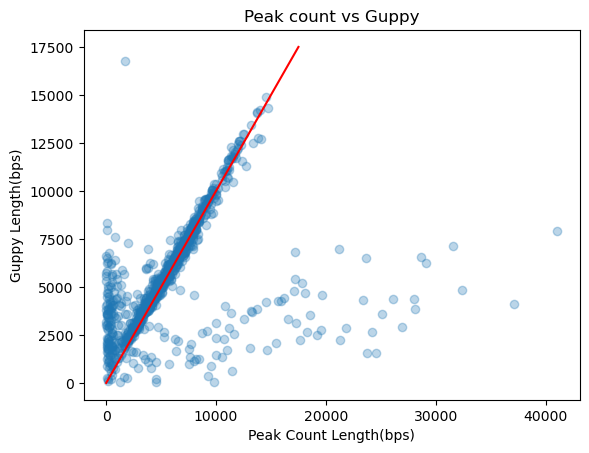

In [39]:
# raw count vs teloNP on guppy
x_values = graphingDF['PeakCountBasedLength']
y_values = graphingDF['TeloNPCorrectedLength']

# Plot the points
plt.scatter(x_values, y_values, alpha=0.3)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Guppy Length(bps)')
plt.title('Peak count vs Guppy')
# plt.grid(True)
plt.show()

In [44]:
# get qnames with peak count around 0-100
shortReads = graphingDF[(graphingDF['PeakCountBasedLength'] < 100) & (graphingDF['PeakCountBasedLength'] > 0)]

In [2]:
# read in guppy and dorado files
doradoFile = "../TelomereBoundaryProject/DoubleBlindRawReadLabels/output/dorado/F63.csv"
doradoDf = pd.read_csv(doradoFile)
# rename column teloNPCorrectedLength to doradoLength
doradoDf = doradoDf.rename(columns={"TeloNPCorrectedLength": "TeloBP.dorado.length"})
doradoDf = doradoDf.rename(columns={"seq.ln": "seq.ln.dorado"})

RawDf = pd.read_csv('output/F63.subset1000.peak.count.V3.1.tsv', sep='\t')
# rename column teloNPCorrectedLength to guppyLength
RawDf = RawDf.rename(columns={"PeakCountBasedLength": "PeakCountBasedLengthGuppy"})

GuppyDf = pd.read_csv("../TelomereBoundaryProject/DoubleBlindRawReadLabels/output/fullDSCorrected/all/F63_NB01.csv")
GuppyDf2= pd.read_csv("../TelomereBoundaryProject/DoubleBlindRawReadLabels/output/fullDSCorrected/all/F63_NB50.csv")
# merge into GuppyDf
GuppyDf = GuppyDf.append(GuppyDf2)
# rename column teloNPCorrectedLength to guppyLength
GuppyDf = GuppyDf.rename(columns={"TeloNPCorrectedLength": "TeloNP.guppy.length"})
GuppyDf = GuppyDf.rename(columns={"seq.ln": "seq.ln.guppy"})

print(doradoDf.columns)
print(RawDf.columns)
print(GuppyDf.columns)

combinedDf = RawDf.merge(doradoDf[['qname', 'TeloBP.dorado.length', "seq.ln.dorado"]], on='qname', how='left')
combinedDf = combinedDf.merge(GuppyDf[['qname', 'TeloNP.guppy.length', "seq.ln.guppy"]], on='qname', how='left')

# merge the seq.ln_x and seq.ln_y columns into one column
# combinedDf["seq.ln"] = combinedDf["seq.ln_x"].fillna(combinedDf["seq.ln_y"])

# drop unnamed: 0
# combinedDf = combinedDf.drop(columns=["Unnamed: 0", "seq.ln_x", "seq.ln_y"])
combinedDf = combinedDf.drop(columns=["Unnamed: 0"])
graphingDF = combinedDf
print(combinedDf.columns)

Index(['Unnamed: 0', 'qname', 'chr', 'strand', 'pos.start', 'pos.end',
       'map.pos.from.Tel', 'mapq', 'seq.ln.dorado', 'Telomere',
       'alnSc.AssiSI.NB01uq', 'isGStrand', 'alnSc.ClaI.NB50uq',
       'Telomere.adap', 'AssiSI.NB01uq.start.aln', 'AssiSI.NB01uq.end.aln',
       'ClaI.NB50uq.start.aln', 'ClaI.NB50uq.end.aln', 'teloBPLengths',
       'end.aln', 'end.aln + 10', 'TeloBP.dorado.length'],
      dtype='object')
Index(['Unnamed: 0', 'qname', 'isGStrand', 'PeakCountBasedLengthGuppy'], dtype='object')
Index(['Unnamed: 0', 'qname', 'chr', 'strand', 'pos.start', 'pos.end',
       'map.pos.from.Tel', 'mapq', 'seq.ln.guppy', 'Telomere.adap',
       'alnSc.AssiSI.NB01uq', 'AssiSI.NB01uq.start.aln',
       'AssiSI.NB01uq.end.aln', 'isGStrand', 'teloBPLengths', 'end.aln',
       'end.aln + 10', 'TeloNP.guppy.length', 'alnSc.ClaI.NB50uq',
       'ClaI.NB50uq.start.aln', 'ClaI.NB50uq.end.aln'],
      dtype='object')
Index(['qname', 'isGStrand', 'PeakCountBasedLengthGuppy',
       'Tel

C:\Users\Ramin Kahidi\AppData\Local\Temp\ipykernel_17284\1288670732.py:15: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  GuppyDf = GuppyDf.append(GuppyDf2)


In [3]:

dotsAbove =getRowsAboveLine(graphingDF, 'PeakCountBasedLengthGuppy', 'TeloNP.guppy.length', c = 2500, m=1)

graphPeaks(dotsAbove, 'PeakCountBasedLengthGuppy', 'TeloNP.guppy.length')
# add signal to dotsAbove
dotsAbove = dotsAbove.merge(signalDf[['qname', 'signal']], on='qname', how='left')

NameError: name 'getRowsAboveLine' is not defined

In [45]:
from matplotlib.backends.backend_pdf import PdfPages
# pp = PdfPages("./Figures/AllFigures.pdf")

pearson correlation: 0.9103550064637206
R squared: 0.8287462377935607
2435
2435


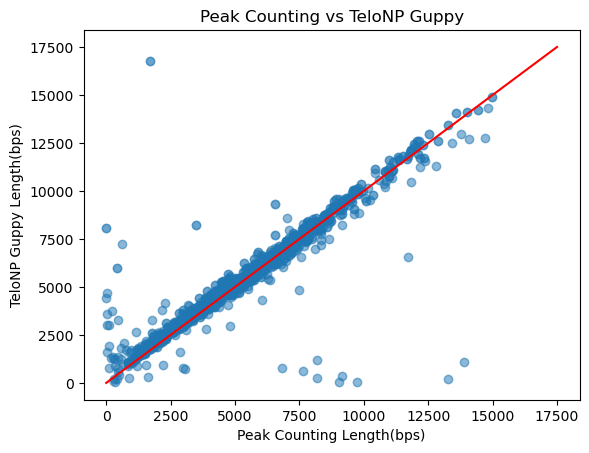

GStrand pearson correlation: 0.9930823795277507
GStrand R squared: 0.9862126125284995
CStrand pearson correlation: 0.9207378564063342
CStrand R squared: 0.8477582002197314


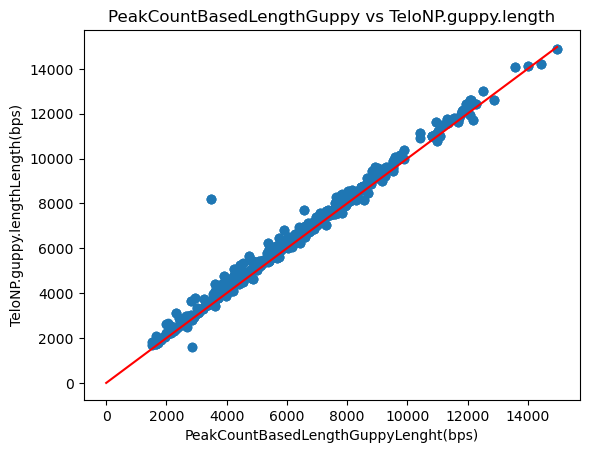

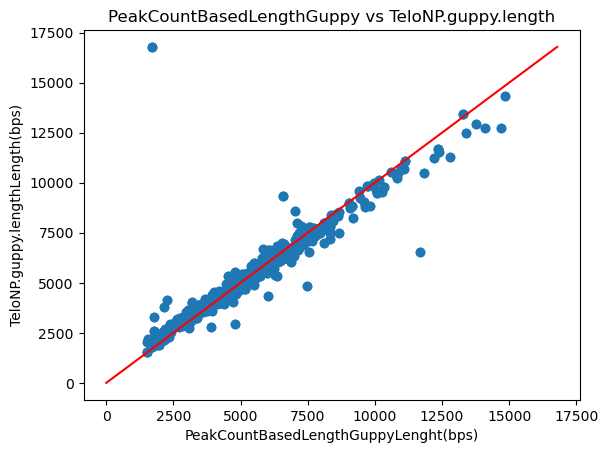

In [8]:
import numpy as np
# raw count vs Guppy
x_values = graphingDF['PeakCountBasedLengthGuppy']
y_values = graphingDF['TeloNP.guppy.length']
# y_values = graphingDF['TeloNP.dorado.length']

# Plot the points
plt.scatter(x_values, y_values, alpha=0.3)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Counting Length(bps)')
plt.ylabel('TeloNP Guppy Length(bps)')
plt.title('Peak Counting vs TeloNP Guppy')
plt.savefig("./Figures/PeakCountingVsTeloNPGuppy.pdf")
# plt.grid(True)

correlation = graphingDF['PeakCountBasedLengthGuppy'].corr(graphingDF['TeloNP.guppy.length'])
print(f"pearson correlation: {correlation}")
print(f"R squared: {correlation**2}")

# add these values to the plot
# plt.text(0, 17000, f"pearson correlation: {correlation}")  
# plt.text(0, 15500, f"R squared: {correlation**2}")

print(len(x_values))
print(len(y_values))

plt.show()
# pp.savefig(TelpNPVPC)
# pp.close()


GstrandDf = graphingDF[graphingDF["isGStrand"] == True]

CstrandDf = graphingDF[graphingDF["isGStrand"] == False]

# filter out reads bellow 1500 on either axis
GstrandDf = GstrandDf[(GstrandDf['PeakCountBasedLengthGuppy'] > 1500) & (GstrandDf['TeloNP.guppy.length'] > 1500)]
CstrandDf = CstrandDf[(CstrandDf['PeakCountBasedLengthGuppy'] > 1500) & (CstrandDf['TeloNP.guppy.length'] > 1500)]

gStrandR = GstrandDf['PeakCountBasedLengthGuppy'].corr(GstrandDf['TeloNP.guppy.length'])
gStrandR2 = gStrandR**2
print(f"GStrand pearson correlation: {gStrandR}")
print(f"GStrand R squared: {gStrandR2}")

cStrandR = CstrandDf['PeakCountBasedLengthGuppy'].corr(CstrandDf['TeloNP.guppy.length'])
cStrandR2 = cStrandR**2
print(f"CStrand pearson correlation: {cStrandR}")
print(f"CStrand R squared: {cStrandR2}")

graphPeaks(GstrandDf, 'PeakCountBasedLengthGuppy', 'TeloNP.guppy.length')
graphPeaks(CstrandDf, 'PeakCountBasedLengthGuppy', 'TeloNP.guppy.length')

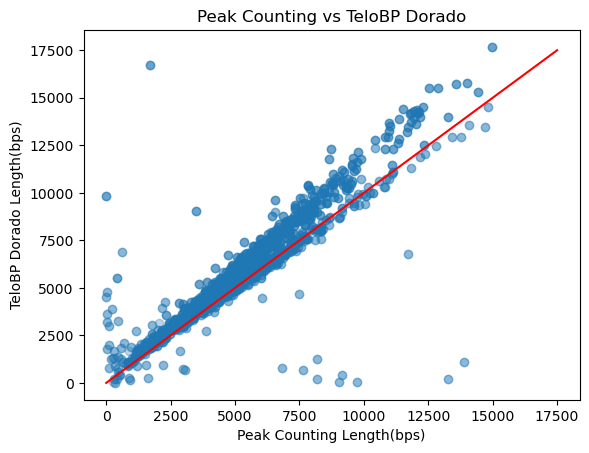

pearson correlation: 0.9038932123412572
R squared: 0.8170229393165971


In [9]:
# trimmedDF = graphingDF[(graphingDF['PeakCountBasedLengthGuppy'] > 1500) & (graphingDF['TeloNP.guppy.length'] > 1500) & (graphingDF["TeloBP.dorado.length"] > 1500)]

# raw count vs Guppy
x_values = graphingDF['PeakCountBasedLengthGuppy']
# y_values = graphingDF['TeloNP.guppy.length']
y_values = graphingDF['TeloBP.dorado.length']

# Plot the points
plt.scatter(x_values, y_values, alpha=0.3)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Counting Length(bps)')
plt.ylabel('TeloBP Dorado Length(bps)')
plt.title('Peak Counting vs TeloBP Dorado')
plt.savefig("./Figures/PeakCountingVsTeloBPDorado.pdf")
# plt.grid(True)
plt.show()



correlation = graphingDF['PeakCountBasedLengthGuppy'].corr(graphingDF['TeloBP.dorado.length'])
print(f"pearson correlation: {correlation}")
print(f"R squared: {correlation**2}")

In [41]:
# !pip install pingouin
from pingouin import ancova

# result = ancova(data=df, dv='exam_score', covar='current_grade', between='technique')
resultsGuppy = ancova(data = graphingDF, dv='PeakCountBasedLengthGuppy', covar='TeloNP.guppy.length', between='isGStrand')
resultsDorado = ancova(data = graphingDF, dv='PeakCountBasedLengthGuppy', covar='TeloBP.dorado.length', between='isGStrand')

# Print the result
print(resultsGuppy)
print(resultsDorado)

                Source            SS    DF             F     p-unc       np2
0            isGStrand  1.503602e+07     1     11.347657  0.000767  0.004673
1  TeloNP.guppy.length  1.514273e+10     1  11428.195567  0.000000  0.825427
2             Residual  3.202604e+09  2417           NaN       NaN       NaN
                 Source            SS    DF             F         p-unc  \
0             isGStrand  2.574232e+08     1    196.127554  6.485059e-43   
1  TeloBP.dorado.length  1.521833e+10     1  11594.659342  0.000000e+00   
2              Residual  3.192072e+09  2432           NaN           NaN   

        np2  
0  0.074626  
1  0.826616  
2       NaN  


In [30]:
# get only GStrand reads
GstrandDf = graphingDF[graphingDF["isGStrand"] == True]

CstrandDf = graphingDF[graphingDF["isGStrand"] == False]

# correlation = graphingDF['PeakCountBasedLengthGuppy'][10000:].corr(graphingDF['TeloBP.dorado.length'][10000:])
gStrandR = GstrandDf['PeakCountBasedLengthGuppy'].corr(GstrandDf['TeloBP.dorado.length'])
gStrandR2 = gStrandR**2
print(f"GStrand pearson correlation: {gStrandR}")
print(f"GStrand R squared: {gStrandR2}")

cStrandR = CstrandDf['PeakCountBasedLengthGuppy'].corr(CstrandDf['TeloBP.dorado.length'])
cStrandR2 = cStrandR**2
print(f"CStrand pearson correlation: {cStrandR}")
print(f"CStrand R squared: {cStrandR2}")

GStrand pearson correlation: 0.9589916820325245
GStrand R squared: 0.9196650462075706
CStrand pearson correlation: 0.8460406879556422
CStrand R squared: 0.7157848456764564


In [7]:

graphingDF["Subtelomere TeloNP Length Guppy"] = graphingDF["seq.ln.guppy"] - graphingDF["TeloNP.guppy.length"]
graphingDF["Subtelomere TeloNP Length Dorado"] = graphingDF["seq.ln.dorado"] - graphingDF["TeloBP.dorado.length"]

# graphPeaks(graphingDF, 'Subtelomere TeloNP Length Guppy', 'Subtelomere TeloNP Length Dorado', opacity=0.3)
graphPeaks(graphingDF, 'TeloNP.guppy.length', 'TeloNP.dorado.length', opacity=0.3)

# Graph Guppy vs Dorado but G strands only
graphingDFGStrand = graphingDF[graphingDF["isGStrand"] == True]
graphPeaks(graphingDFGStrand, 'TeloNP.guppy.length', 'TeloBP.dorado.length', opacity=0.3)

# Graph Guppy vs Dorado but C strands only
graphingDFCStrand = graphingDF[graphingDF["isGStrand"] == False]
graphPeaks(graphingDFCStrand, 'TeloNP.guppy.length', 'TeloBP.dorado.length', opacity=0.3)


KeyError: 'TeloNP.dorado.length'

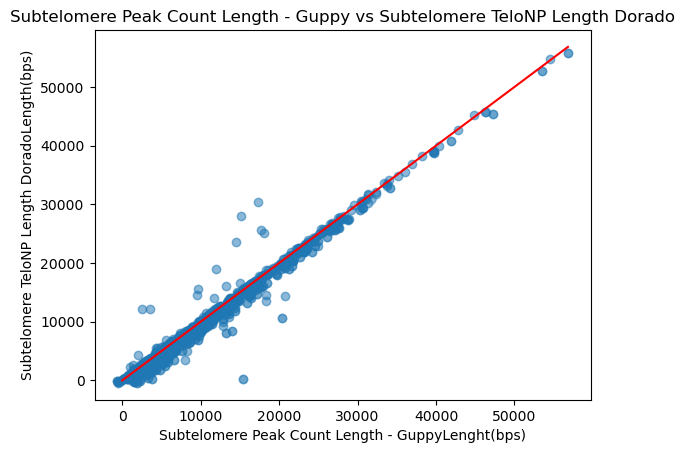

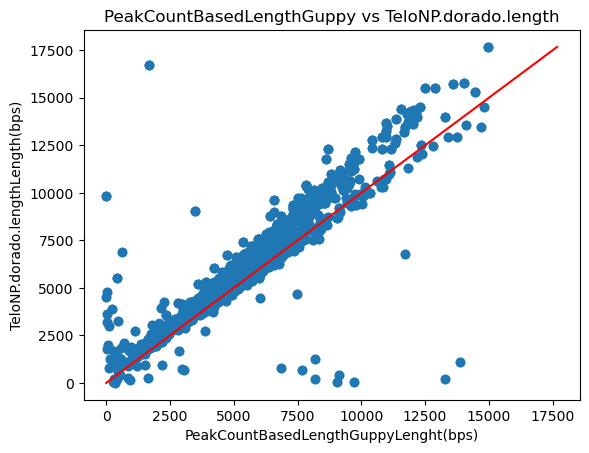

In [7]:
# Get the subtelomere lengths for each read using the peak count method



graphingDF["Subtelomere Peak Count Length Guppy"] = graphingDF["seq.ln"] - graphingDF["PeakCountBasedLengthGuppy"]
graphingDF["Subtelomere TeloNP Length Dorado"] = graphingDF["seq.ln"] - graphingDF["TeloNP.dorado.length"]

# rename TeloNp.dorado.length to TeloNP.dorado.length
# graphingDF = graphingDF.rename(columns={"TeloNp.dorado.length": "TeloNP.dorado.length"})

graphPeaks(graphingDF, 'Subtelomere Peak Count Length - Guppy', 'Subtelomere TeloNP Length Dorado', opacity=0.3)
graphPeaks(graphingDF, 'PeakCountBasedLengthGuppy', 'TeloNP.dorado.length')

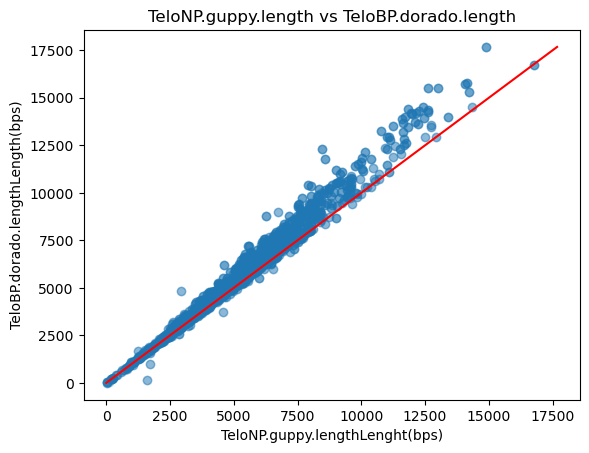

2435


In [58]:
# TeloNP Guppy vs dorado
graphPeaks(graphingDF, 'TeloNP.guppy.length', 'TeloBP.dorado.length', opacity=0.3, pdfOut="./Figures/TeloNPGuppyVsTeloBPDorado.pdf")
# get amount of reads
print(len(graphingDF))

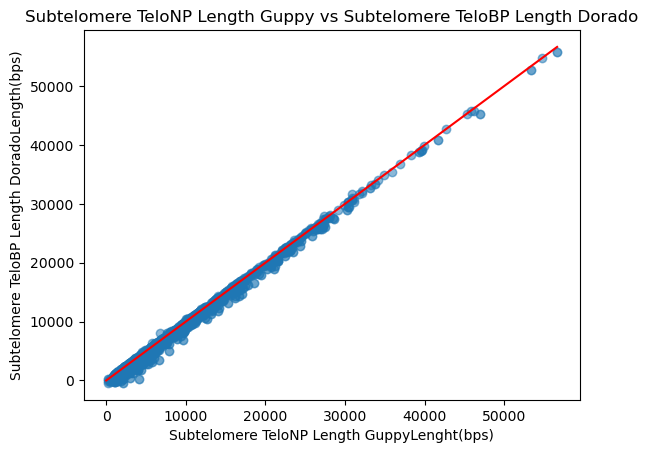

In [57]:
# Get the subtelomere lengths for each read using the peak count method

graphingDF["Subtelomere TeloNP Length Guppy"] = graphingDF["seq.ln.guppy"] - graphingDF["TeloNP.guppy.length"]
graphingDF["Subtelomere TeloBP Length Dorado"] = graphingDF["seq.ln.dorado"] - graphingDF["TeloBP.dorado.length"]

# rename TeloNp.dorado.length to TeloNP.dorado.length
# graphingDF = graphingDF.rename(columns={"TeloNp.dorado.length": "TeloNP.dorado.length"})

graphPeaks(graphingDF, 'Subtelomere TeloNP Length Guppy', 'Subtelomere TeloBP Length Dorado', opacity=0.3, pdfOut="./Figures/SubtelomereTeloNPGuppyVsTeloBPDorado.pdf") 
# graphPeaks(graphingDF, 'PeakCountBasedLengthGuppy', 'TeloNP.dorado.length')

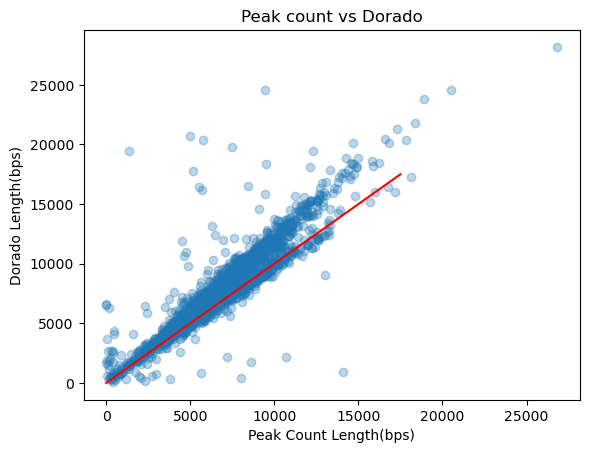

In [ ]:
# raw count vs Dorado
x_values = graphingDF['PeakCountBasedLength']
y_values = graphingDF['F71.Dorado.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values, alpha=0.3)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Dorado Length(bps)')
plt.title('Peak count vs Dorado')
# plt.grid(True)
plt.show()

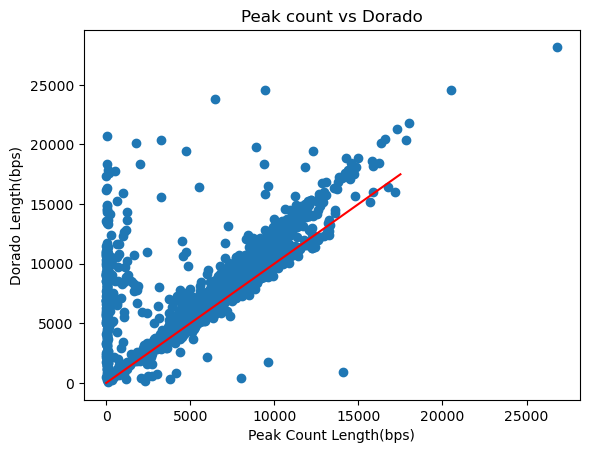

In [ ]:
# raw count vs Dorado
x_values = graphingDF['PeakCountBasedLength']
y_values = graphingDF['F71.Dorado.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Dorado Length(bps)')
plt.title('Peak count vs Dorado')
# plt.grid(True)
plt.show()

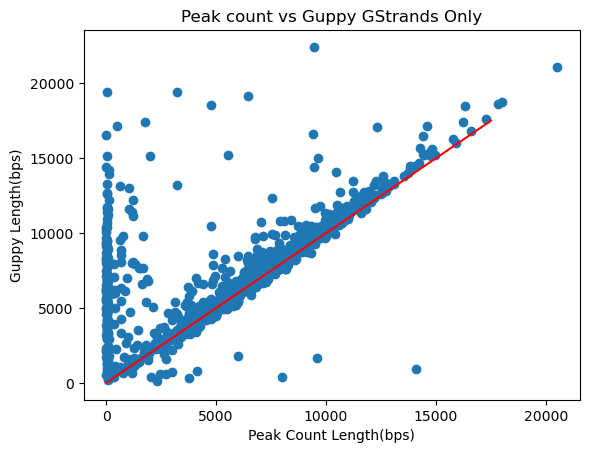

In [30]:
# raw count vs Guppy for GStrands
x_values = graphingDF.loc[graphingDF['isGStrand'] == True, 'PeakCountBasedLength']
y_values = graphingDF.loc[graphingDF['isGStrand'] == True, 'F61.Guppy.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Guppy Length(bps)')
plt.title('Peak count vs Guppy GStrands Only')
# plt.grid(True)
plt.show()

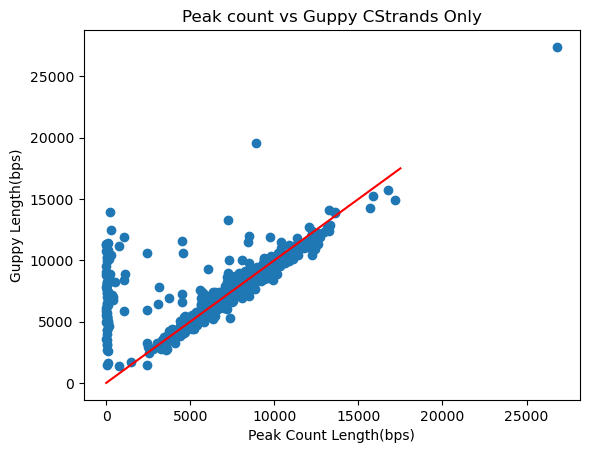

In [28]:
# raw count vs Guppy for CStrands
x_values = graphingDF.loc[graphingDF['isGStrand'] == False, 'PeakCountBasedLength']
y_values = graphingDF.loc[graphingDF['isGStrand'] == False, 'F61.Guppy.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Guppy Length(bps)')
plt.title('Peak count vs Guppy CStrands Only')
# plt.grid(True)
plt.show()

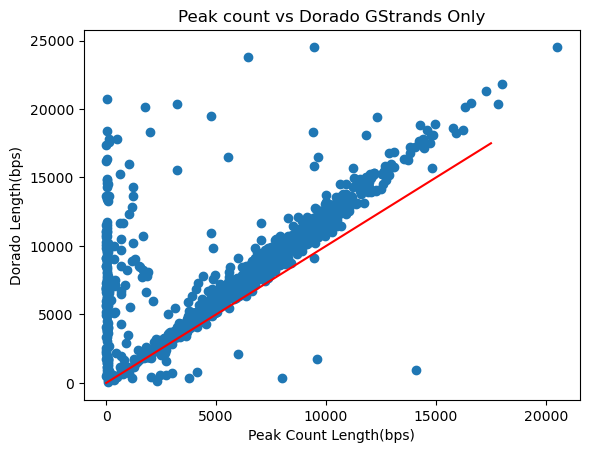

In [31]:
# raw count vs Dorado for GStrands
x_values = graphingDF.loc[graphingDF['isGStrand'] == True, 'PeakCountBasedLength']
y_values = graphingDF.loc[graphingDF['isGStrand'] == True, 'F71.Dorado.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Dorado Length(bps)')
plt.title('Peak count vs Dorado GStrands Only')
# plt.grid(True)
plt.show()

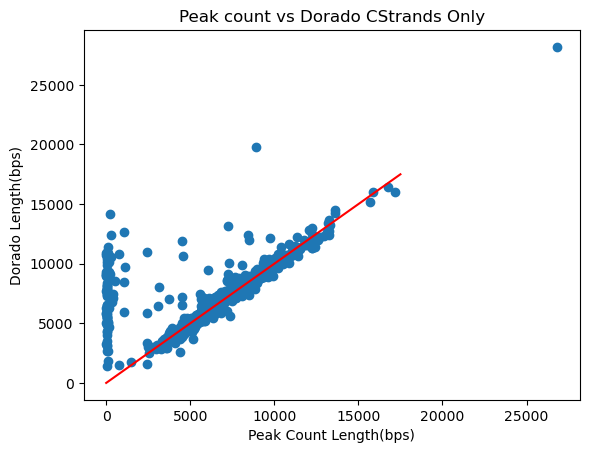

In [29]:
# raw count vs Dorado for GStrands
x_values = graphingDF.loc[graphingDF['isGStrand'] == False, 'PeakCountBasedLength']
y_values = graphingDF.loc[graphingDF['isGStrand'] == False, 'F71.Dorado.Tel.bp']

# Plot the points
plt.scatter(x_values, y_values)
plt.plot([0,17500], [0,17500], 'r-')
plt.xlabel('Peak Count Length(bps)')
plt.ylabel('Dorado Length(bps)')
plt.title('Peak count vs Dorado CStrands Only')
# plt.grid(True)
plt.show()

In [10]:
# dvsGWithSignalShortened
dvsGWithSignalShortened.to_csv('output/rawSignalAnalysis.csv')
dvsGWithSignalShortened.to_csv('output/rawSignalAnalysis.tsv', sep='\t')

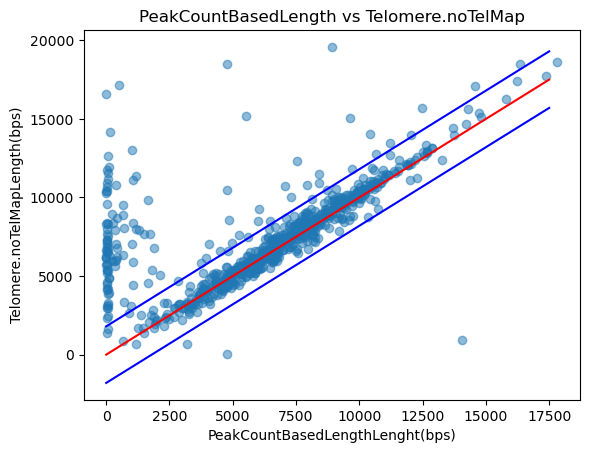

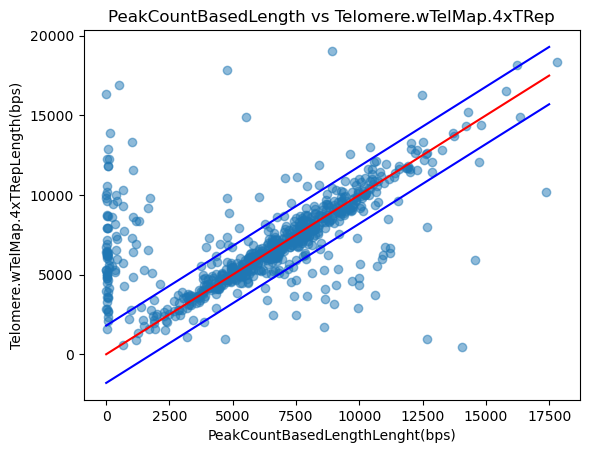

In [26]:
# mapping differences peakCount and mapping lengths
# "Telomere.noTelMap" and "Telomere.wTelMap.4xTRep"
offsetGraph = 1800
opacity = 0.5
graphPeaks(graphingDF, 'PeakCountBasedLength', 'Telomere.noTelMap', offset=offsetGraph, opacity=opacity)

graphPeaks(graphingDF, 'PeakCountBasedLength', 'Telomere.wTelMap.4xTRep',offset=offsetGraph, opacity=opacity)


In [9]:
def getRowsBelowLine(df, xCol, yCol, c, m=1):
    # Calculate the diagonal line values for the 'X' column
    diagonal_line_values = m * df[xCol] + c

    # Filter rows where 'Y' values are below the diagonal line
    filtered_df = df[df[yCol] < diagonal_line_values]

    return filtered_df

def getRowsAboveLine(df, xCol, yCol, c, m=1):
    # Calculate the diagonal line values for the 'X' column
    diagonal_line_values = m * df[xCol] + c

    # Filter rows where 'Y' values are below the diagonal line
    filtered_df = df[df[yCol] > diagonal_line_values]

    return filtered_df

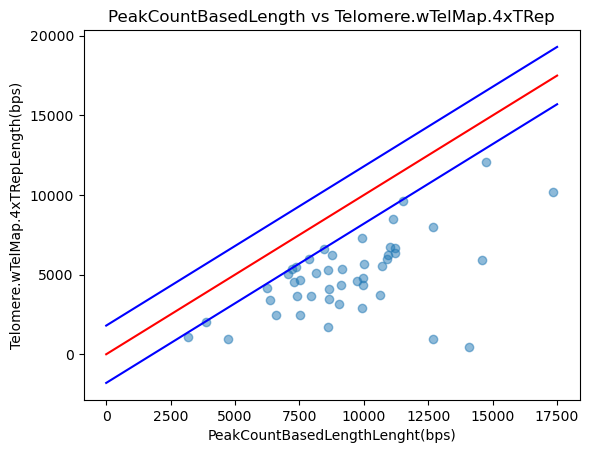

In [35]:


dotsBelow =getRowsBelowLine(graphingDF, 'PeakCountBasedLength', 'Telomere.wTelMap.4xTRep', c = -1800, m=1)

graphPeaks(dotsBelow, 'PeakCountBasedLength', 'Telomere.wTelMap.4xTRep',offset=offsetGraph, opacity=opacity)
dotsBelow
dotsBelow.to_csv('output/Tel.diff.by.mapping.peak.count.lower.cloud.tsv', sep='\t', index=False)

In [75]:
# Show rows where rawValue is not null
# dfDvsG = dfDvsG[dfDvsG["rawValue"].notnull()]
dfDvsG['diff'] = abs(dfDvsG['F71.Dorado.Tel.bp'] - dfDvsG['F61.Guppy.Tel.bp'])
dfDvsG = dfDvsG.sort_values(by=['diff'] , ascending=False)

# Grab top 5 sequences
dfDvsGTop = dfDvsG.head(50)
dfDvsGTop 

,qname,chr,strand,F71.Dorado.Tel.bp,F61.Guppy.Tel.bp,diff
19372,b79fd08e-8953-43a4-bd77-4e668ad265ca,chr16q,+,24344,16475,7869
18971,b40fd71e-e2d2-4f5d-82fa-d53fbc027d91,chr19q,+,22235,14754,7481
3069,1d02d4fd-f9db-4dea-9097-7b81dfd5f993,chr16q,+,30152,22969,7183
8416,5047f595-e9d4-4a95-ae73-82c904bcc94f,chr08p,-,23132,16510,6622
12654,779e9f09-509e-4fea-bff2-c9a3d29c5d2d,chr16q,+,19061,12456,6605
8404,50201801-cad9-4338-b274-13e7866a9f2d,chr21p,-,18091,11599,6492
20117,be79e0aa-ce79-47e4-bf24-1ee49a94141c,chr02p,-,25326,18852,6474
25446,f0958dfe-c4fe-47ba-9aa6-287d3809f090,chr21p,-,18268,12834,5434
6424,3cc80aa1-5e99-4811-9bea-355e687038db,chr09q,+,19880,14587,5293
11486,6ce3bc58-9a3a-4839-bba8-4a2b331c5aad,chr05p,-,17166,11881,5285


In [78]:
# Find the index of a specific value in the headers list
print(headers[0])
print(headers[1] in headers)
fileNames = []
for i in headers:
    fileNames.append(i[1])
index = fileNames.index("1d02d4fd-f9db-4dea-9097-7b81dfd5f993")
print(index)

['FAW67554_6011a141_6448b7b8_20.fast5', '0001b440-4f27-47f1-b898-b51953f91071']
True


ValueError: '1d02d4fd-f9db-4dea-9097-7b81dfd5f993' is not in list

In [17]:
graphingDF.loc[(graphingDF['isGStrand'] == True) & (graphingDF['PeakCountBasedLength'] > 14000)].to_csv("./output/Raw.Single.Analysis.gStrand.Over14000.tsv", sep="\t", index=False)
